In [1]:
import numpy as np
import pandas as pd

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import plotly.express as px #plotly.express (px): Data visualization library jo easy aur quick plots banata hai.
import plotly.graph_objects as go #plotly.graph_objects (go): Advanced and customizable graphs banane ke liye
import plotly.io as pio   #plotly.io (pio): Graph templates ko customize karne ke liye
import plotly.colors as colors 
pio.templates.default = "plotly_white"  #pio.templates.default = "plotly_white": Default theme white rakha gaya hai graphs ke liye

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
d_f = pd.read_csv('marketing_campaign_dataset.csv')

In [6]:
d_f.head(3)

,Campaign_ID,Company,Campaign_Type,Target_Audience,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,Language,Clicks,Impressions,Engagement_Score,Customer_Segment,Date
0,1,Innovate Industries,Email,Men 18-24,30 days,Google Ads,0.04,"$16,174.00",6.29,Chicago,Spanish,506,1922,6,Health & Wellness,2021-01-01
1,2,NexGen Systems,Email,Women 35-44,60 days,Google Ads,0.12,"$11,566.00",5.61,New York,German,116,7523,7,Fashionistas,2021-01-02
2,3,Alpha Innovations,Influencer,Men 25-34,30 days,YouTube,0.07,"$10,200.00",7.18,Los Angeles,French,584,7698,1,Outdoor Adventurers,2021-01-03


In [7]:
d_f['Acquisition_Cost'] = d_f['Acquisition_Cost'].str.replace('$', '', regex=False)
d_f['Acquisition_Cost'] = d_f['Acquisition_Cost'].str.replace(',', '').astype(float)

In [8]:
d_f['Revenue'] = d_f.Acquisition_Cost * (1+d_f.ROI)

In [9]:
d_f['Date'] = pd.to_datetime(d_f['Date'])

In [10]:
d_f['Year'] = d_f['Date'].dt.year
d_f['Month'] = d_f['Date'].dt.month
d_f['Qtr']= d_f['Date'].dt.quarter
d_f['DoW'] = d_f['Date'].dt.dayofweek

In [11]:
d_f.columns

Index(['Campaign_ID', 'Company', 'Campaign_Type', 'Target_Audience',
       'Duration', 'Channel_Used', 'Conversion_Rate', 'Acquisition_Cost',
       'ROI', 'Location', 'Language', 'Clicks', 'Impressions',
       'Engagement_Score', 'Customer_Segment', 'Date', 'Revenue', 'Year',
       'Month', 'Qtr', 'DoW'],
      dtype='object')

In [12]:
def get_season(Month):
    if Month in [12, 1, 2]:
        return 'Winter'
    elif Month in [3, 4, 5]:
        return 'Spring'
    elif Month in [6, 7, 8]:
        return 'Summer'
    elif Month in [9, 10, 11]:
        return 'Fall'
    return 'Unknown'

# Apply the function to the 'Month' column to create the 'Season' column
d_f['Season'] = d_f['Month'].apply(get_season)

In [13]:
d_f['Month'] = d_f.Month.map({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',
                              7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})

d_f['DoW'] = d_f.DoW.map({0:'Mon',1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'})

d_f['Qtr'] = d_f.Qtr.map({1:'Q1',2:'Q2',3:'Q3',4:'Q4'})

In [14]:
f2 = px.pie(d_f, values="Revenue", names="Qtr")
f2.show()

In [15]:
d_f.head()

,Campaign_ID,Company,Campaign_Type,Target_Audience,Duration,Channel_Used,Conversion_Rate,Acquisition_Cost,ROI,Location,...,Impressions,Engagement_Score,Customer_Segment,Date,Revenue,Year,Month,Qtr,DoW,Season
0,1,Innovate Industries,Email,Men 18-24,30 days,Google Ads,0.04,16174.0,6.29,Chicago,...,1922,6,Health & Wellness,2021-01-01,117908.46,2021,Jan,Q1,Fri,Winter
1,2,NexGen Systems,Email,Women 35-44,60 days,Google Ads,0.12,11566.0,5.61,New York,...,7523,7,Fashionistas,2021-01-02,76451.26,2021,Jan,Q1,Sat,Winter
2,3,Alpha Innovations,Influencer,Men 25-34,30 days,YouTube,0.07,10200.0,7.18,Los Angeles,...,7698,1,Outdoor Adventurers,2021-01-03,83436.00,2021,Jan,Q1,Sun,Winter
3,4,DataTech Solutions,Display,All Ages,60 days,YouTube,0.11,12724.0,5.55,Miami,...,1820,7,Health & Wellness,2021-01-04,83342.20,2021,Jan,Q1,Mon,Winter
4,5,NexGen Systems,Email,Men 25-34,15 days,YouTube,0.05,16452.0,6.50,Los Angeles,...,4201,3,Health & Wellness,2021-01-05,123390.00,2021,Jan,Q1,Tue,Winter


In [16]:
print("\tTOTAL SPENT : ",d_f['Acquisition_Cost'].sum())

	TOTAL SPENT :  2500878608.0


In [17]:
print("\tTOTAL REVENUE : ",d_f['Revenue'].sum())

	TOTAL REVENUE :  15018267282.24


In [18]:
print("\tTOTAL PROFIT : ",d_f['Revenue'].sum()-d_f['Acquisition_Cost'].sum())

	TOTAL PROFIT :  12517388674.24


In [19]:
sales_by_cam_type= d_f.groupby('Campaign_Type')['Revenue'].sum().reset_index()


fig = px.pie(sales_by_cam_type, 
             values='Revenue', 
             names='Campaign_Type', 
             hole=0.5, 
             color_discrete_sequence=px.colors.qualitative.Pastel)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(title_text='Sales Analysis by Campaign Type', title_font=dict(size=24))

fig.show()

<Axes: xlabel='Month', ylabel='Revenue'>

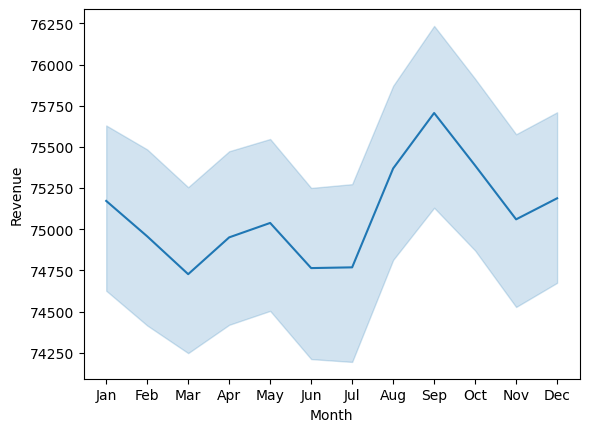

In [20]:
sns.lineplot(x='Month',y='Revenue',data=d_f)

In [21]:
rev_by_dur = d_f.groupby('Duration')['Revenue'].sum().reset_index()
fig = px.line(rev_by_dur, 
              x='Duration', 
              y='Revenue', 
              title='Duration Rev Analysis')
fig.show()

In [22]:
profit_by_Channel_Used = d_f.groupby('Channel_Used')['Revenue'].sum().reset_index()

fig = px.pie(profit_by_Channel_Used, 
             values='Revenue', 
             names='Channel_Used', 
             hole=0.5, 
             color_discrete_sequence=px.colors.qualitative.Pastel)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(title_text='Profit Analysis by Channel Used', title_font=dict(size=24))

fig.show()

In [23]:
profit_by_Customer_Segment= d_f.groupby('Customer_Segment')['Revenue'].sum().reset_index()
fig = px.bar(profit_by_Customer_Segment, x='Customer_Segment', 
             y='Revenue', 
             title='Renenue Analysis by Customer Segment')
fig.show()

In [24]:
d_f.Company.value_counts()[:3]

Company
TechCorp              40237
Alpha Innovations     40051
DataTech Solutions    40012
Name: count, dtype: int64

In [25]:
f1 = px.treemap(d_f, path=['Location','Language'],
                 values='Revenue')

f1.show()

In [26]:
plt.figure(figsize=(20,8))
fig = go.Figure(go.Funnelarea(
    text = d_f.Target_Audience.value_counts().index,
    values = d_f.Location.value_counts().values
    ))
fig.show()

<Figure size 2000x800 with 0 Axes>

<Axes: xlabel='DoW', ylabel='Campaign_Type'>

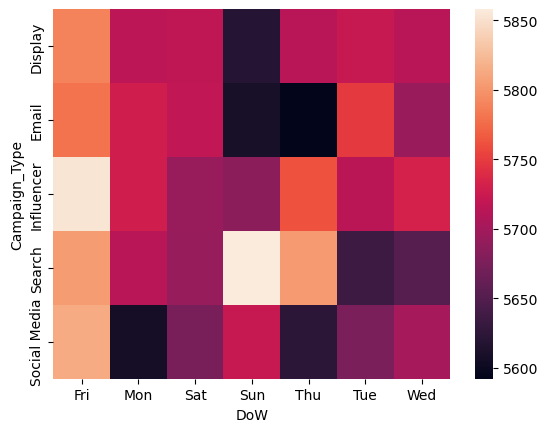

In [27]:
sns.heatmap(pd.crosstab(d_f.Campaign_Type , d_f.DoW))

In [28]:
d_f['Profit'] = d_f['Revenue'] - d_f['Acquisition_Cost']

In [29]:
sales_profit_by_segment = d_f.groupby('Customer_Segment').agg({'Revenue': 'sum', 'Profit': 'sum'}).reset_index()

color_palette = colors.qualitative.Pastel

fig = go.Figure()
fig.add_trace(go.Bar(x=sales_profit_by_segment['Customer_Segment'], 
                     y=sales_profit_by_segment['Revenue'], 
                     name='Revenue',
                     marker_color=color_palette[1]))

fig.add_trace(go.Bar(x=sales_profit_by_segment['Customer_Segment'], 
                     y=sales_profit_by_segment['Profit'], 
                     name='Profit',
                     marker_color=color_palette[2]))

fig.update_layout(title='Sales and Profit Analysis by Customer Segment',
                  xaxis_title='Customer Segment', yaxis_title='Amount')

fig.show()

In [30]:
rev_profit_by_segment = d_f.groupby('Customer_Segment').agg({'Revenue': 'sum', 'Profit': 'sum'}).reset_index()
rev_profit_by_segment['Revenue_to_Profit_Ratio'] = rev_profit_by_segment['Revenue'] / rev_profit_by_segment['Profit']
print(rev_profit_by_segment[['Customer_Segment', 'Revenue_to_Profit_Ratio']])

      Customer_Segment  Revenue_to_Profit_Ratio
0         Fashionistas                 1.199958
1              Foodies                 1.199531
2    Health & Wellness                 1.199733
3  Outdoor Adventurers                 1.200093
4     Tech Enthusiasts                 1.199651


<Axes: xlabel='Target_Audience', ylabel='Campaign_Type'>

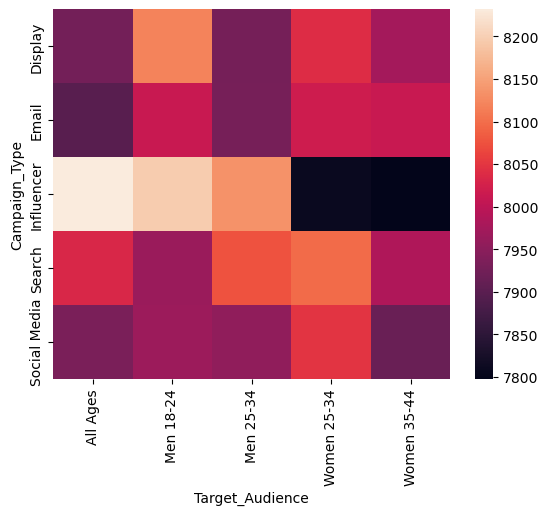

In [31]:
sns.heatmap(pd.crosstab(d_f.Campaign_Type,d_f.Target_Audience))

<Axes: xlabel='Channel_Used', ylabel='count'>

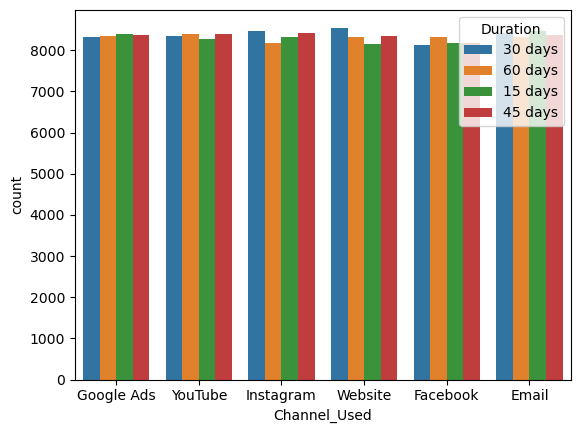

In [32]:
sns.countplot(x=d_f.Channel_Used,hue=d_f.Duration)

AttributeError: 'Axes' object has no attribute 'get_height'

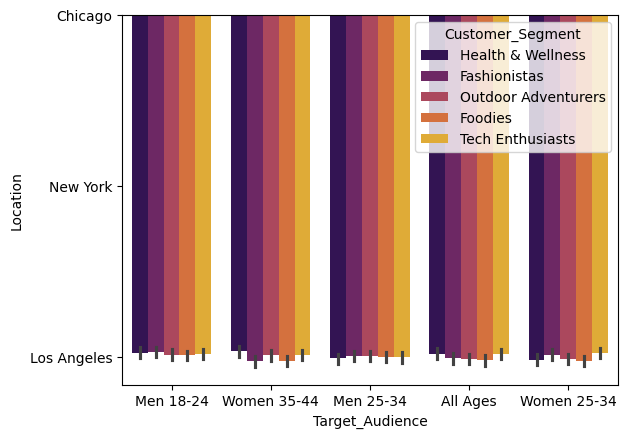

In [33]:
pa = sns.barplot(x='Target_Audience',y='Location',hue='Customer_Segment',data=d_f,palette='inferno') 
for p1 in pa.patches:
    pa.annotate(f'{pa.get_height():.0f}', 
                (pa.get_x() + pa.get_width() / 2., pa.get_height()), 
                ha='center', va='bottom', fontsize=10)
pa.get_height()
plt.title("Customer Count by Target_audience")
plt.tight_layout()
plt.show()

<Axes: xlabel='Target_Audience', ylabel='Customer_Segment'>

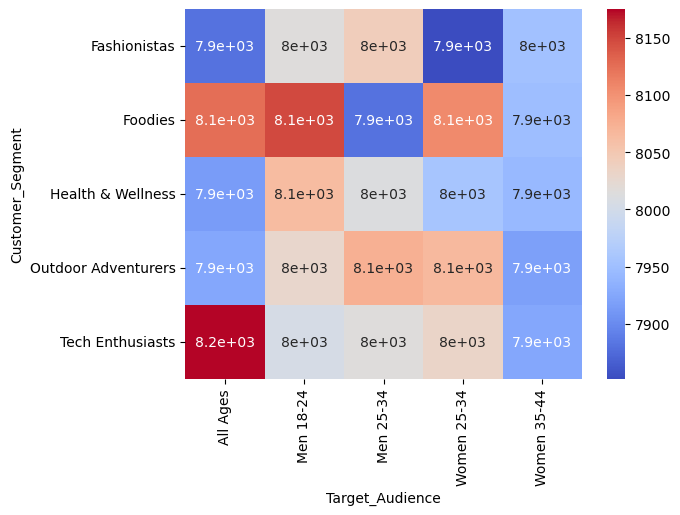

In [34]:
sns.heatmap(pd.crosstab(d_f.Customer_Segment , d_f.Target_Audience ),annot=True,cmap='coolwarm')

In [38]:
d_f.groupby('Season')['Revenue'].sum().sort_values(ascending=False)

Season
Summer    3.779656e+09
Spring    3.776396e+09
Fall      3.759268e+09
Winter    3.702948e+09
Name: Revenue, dtype: float64

In [41]:
pd.pivot_table(d_f,index='Season',values='Revenue',aggfunc=['sum'])

,sum
,Revenue
Season,
Fall,3.759268e+09
Spring,3.776396e+09
Summer,3.779656e+09
Winter,3.702948e+09
